# <font color=red><center>**Energy Consumption**</center></font>

In [2]:
## Data reading
import pandas as pd
import numpy as np

## Plotting libraries
import matplotlib.pyplot as plt
from matplotlib import ticker

import seaborn as sns

# plotly
# import chart_studio.plotly as py
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px


from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, month_plot
from statsmodels.tsa.seasonal import STL

# Scikit-Learn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.neural_network import MLPRegressor
import xgboost as xgb
# from lightgbm import LGBMRegressor as lgb
import lightgbm as lgb
from sklearn import neighbors
from sklearn.svm import SVR
import sklearn
from sklearn.metrics import mean_squared_error
import time
from math import sqrt
import pprint

#Interpretability

import shap

%matplotlib inline

C:\Users\adity\AppData\Roaming\Python\Python310\site-packages\shap\utils\_clustering.py:35: NumbaDeprecationWarning:

The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.

C:\Users\adity\AppData\Roaming\Python\Python310\site-packages\shap\utils\_clustering.py:54: NumbaDeprecationWarning:

The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.

C:\Users\adity\AppData\Roaming\Python\Python310\site-packages\shap\utils\_clustering.py:

In [3]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

## <font color=white> Load Data </font>

In [4]:
df = pd.read_csv("energydata_complete.csv")
df.head(1)

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.79,19.79,44.73,19.0,45.566667,17.166667,55.2,7.026667,84.256667,17.2,41.626667,18.2,48.9,17.033333,45.53,6.6,733.5,92.0,7.0,63.0,5.3,13.275433,13.275433


### <font color=blue>Check shape of data </font>

In [5]:
df.shape

(19735, 29)

## <font color=blue> Check missing values </font>

In [6]:
df.isnull().sum()

date           0
Appliances     0
lights         0
T1             0
RH_1           0
T2             0
RH_2           0
T3             0
RH_3           0
T4             0
RH_4           0
T5             0
RH_5           0
T6             0
RH_6           0
T7             0
RH_7           0
T8             0
RH_8           0
T9             0
RH_9           0
T_out          0
Press_mm_hg    0
RH_out         0
Windspeed      0
Visibility     0
Tdewpoint      0
rv1            0
rv2            0
dtype: int64

## <font color=blue>Understanding the data</font>

### <font color=green> Visualize correlation matrix for values greater than 0.7</font>

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


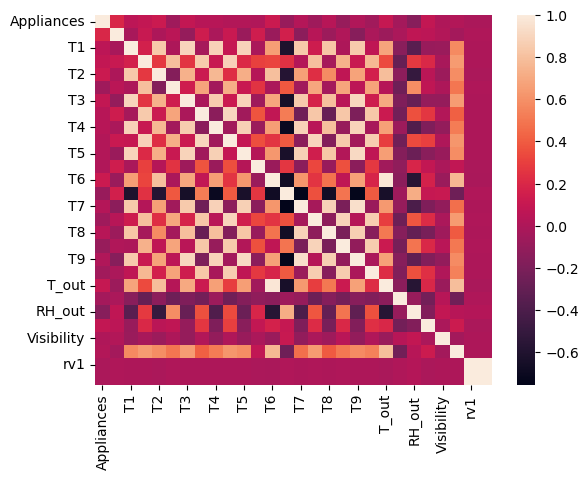

In [7]:
sns.heatmap(df.corr())
plt.show()

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


<Axes: >

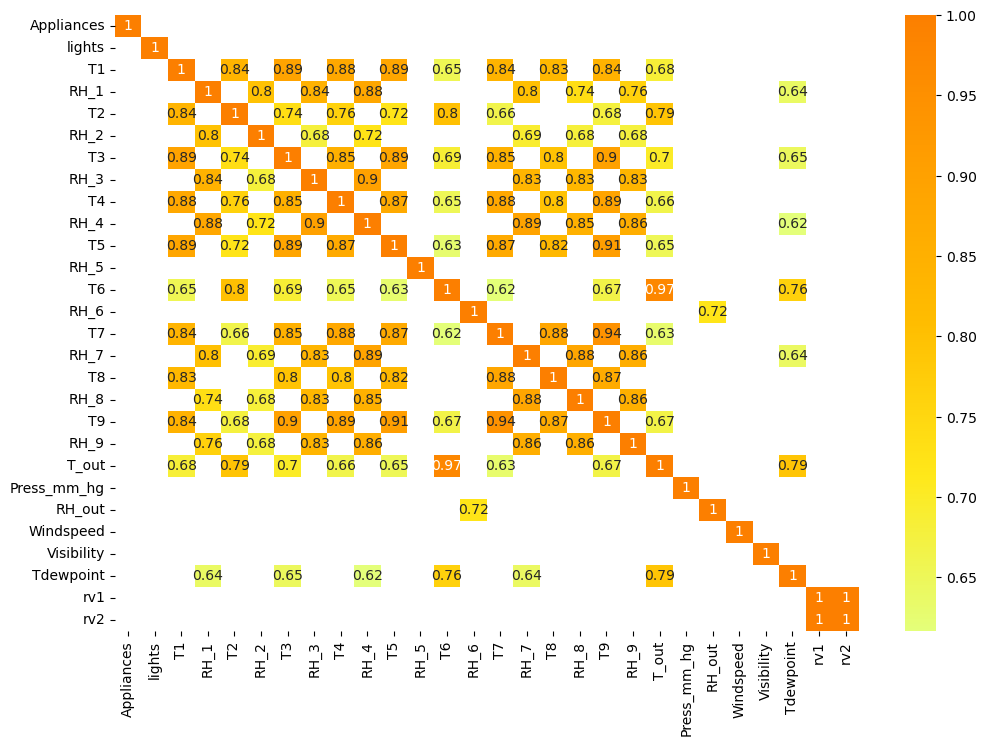

In [8]:
corr = df.corr()

kot = corr[corr>=.6]
plt.figure(figsize=(12,8))
sns.heatmap(kot, cmap="Wistia", annot= True)

### The variables Press_mm_hg, rv1, rv2 and Visibility, Tdewpoint have no correlations with the output. We can remove them from the data

### <font color=green>Additional Features: Get day, hour of the week</font>

In [9]:
df_dates = df.copy()
df_dates['date_col'] = pd.to_datetime(df_dates['date']).dt.date
df_dates['day_of_week'] = pd.to_datetime(df_dates['date_col']).dt.day_name()
df_dates['hour_of_day'] = pd.to_datetime(df_dates['date']).dt.hour

### <font color=green>Get dummies will convert into numerical columns</font>

In [10]:
df1 = pd.concat((df_dates, pd.get_dummies(pd.to_datetime(df_dates['date_col']).dt.day_name())), axis=1)
df1 = df1.drop('day_of_week',axis=1)
df1 = df1.drop('date_col',axis=1)
df1 = df1.drop('date',axis=1)

In [11]:
df_dates['date_col'] = pd.to_datetime(df_dates['date_col'])

In [12]:
df_dates.shape

(19735, 32)

### <font color=green>Plot heatmap of first 4 weeks</font>

In [13]:
week1 = df_dates[(df_dates['date_col'] > '2016-01-11') & (df_dates['date_col'] < '2016-01-19')].reset_index(drop=True)
week2 = df_dates[(df_dates['date_col'] > '2016-01-18') & (df_dates['date_col'] < '2016-01-26')].reset_index(drop=True)
week3 = df_dates[(df_dates['date_col'] > '2016-01-25') & (df_dates['date_col'] < '2016-02-03')].reset_index(drop=True)
week4 = df_dates[(df_dates['date_col'] > '2016-02-02') & (df_dates['date_col'] < '2016-02-10')].reset_index(drop=True)

In [14]:
piv1 = pd.pivot_table(df_dates, values="Appliances",index=["hour_of_day"], columns=["day_of_week"], fill_value=0)
piv2 = pd.pivot_table(df_dates, values="Appliances",index=["hour_of_day"], columns=["day_of_week"], fill_value=0)
piv3 = pd.pivot_table(df_dates, values="Appliances",index=["hour_of_day"], columns=["day_of_week"], fill_value=0)
piv4 = pd.pivot_table(df_dates, values="Appliances",index=["hour_of_day"], columns=["day_of_week"], fill_value=0)

In [15]:
piv1

day_of_week,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
hour_of_day,,,,,,,
0,49.000000,53.684211,49.122807,50.000000,49.250000,66.083333,52.083333
1,48.916667,52.719298,48.245614,51.052632,49.416667,56.250000,52.583333
2,49.333333,50.964912,47.543860,48.684211,48.416667,49.083333,49.500000
3,48.166667,50.175439,47.719298,49.473684,46.750000,47.083333,48.416667
4,48.916667,50.438596,47.982456,50.000000,47.333333,48.833333,52.000000
5,49.333333,54.824561,46.403509,50.263158,53.083333,59.833333,55.083333
6,72.833333,56.228070,48.771930,48.157895,50.333333,53.000000,73.666667
7,104.250000,71.403509,68.157895,72.280702,78.750000,82.333333,72.166667
8,128.000000,94.035088,99.122807,131.403509,91.333333,87.416667,112.000000


### <font color=green> Visualize hourly energy consumption every day for the first 4 weeks</font>

Text(0.5, 1.0, 'Week4')

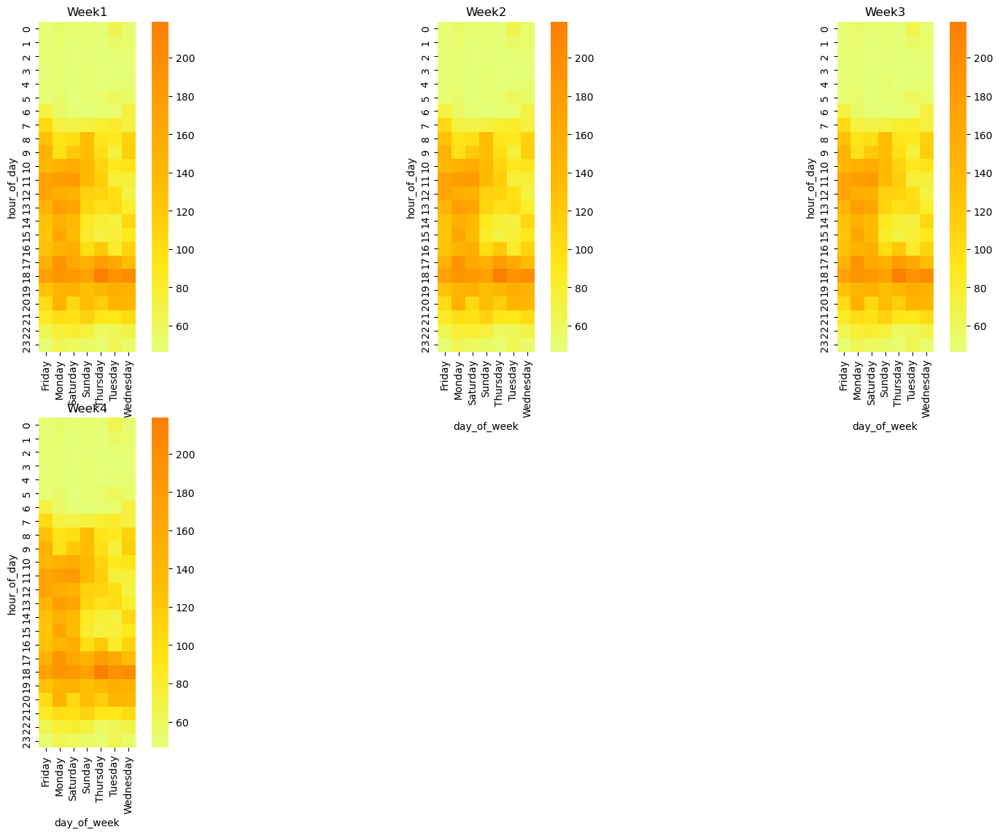

In [16]:
fig = plt.figure(figsize = (20,20)) # width x height
ax1 = fig.add_subplot(3, 3, 1) # row, column, position
ax2 = fig.add_subplot(3, 3, 2)
ax3 = fig.add_subplot(3, 3, 3)
ax4 = fig.add_subplot(3, 3, 4)
cmap="Wistia"
# We use ax parameter to tell seaborn which subplot to use for this plot
sns.heatmap(data=piv1, ax=ax1, cmap = cmap, square=True)
ax1.set_title('Week1')
sns.heatmap(data=piv2, ax=ax2, cmap = cmap, square=True)
ax2.set_title('Week2')
sns.heatmap(data=piv3, ax=ax3, cmap = cmap, square=True)
ax3.set_title('Week3')
sns.heatmap(data=piv4, ax=ax4, cmap = cmap, square=True)
ax4.set_title('Week4')

 - <font color=red>**As expected, energy consumption is high during morning hours and at 6pm**</font>

 - <font color=red>**Bizarrely, Tuesday Wednesday Thursday seem to have lower energy consumption than the rest**</font>

 - <font color=red>**Otherwise, no obvious patterns are visible**</font>

### <font color=green> Visualize output variable - Plot the distribution</font>



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



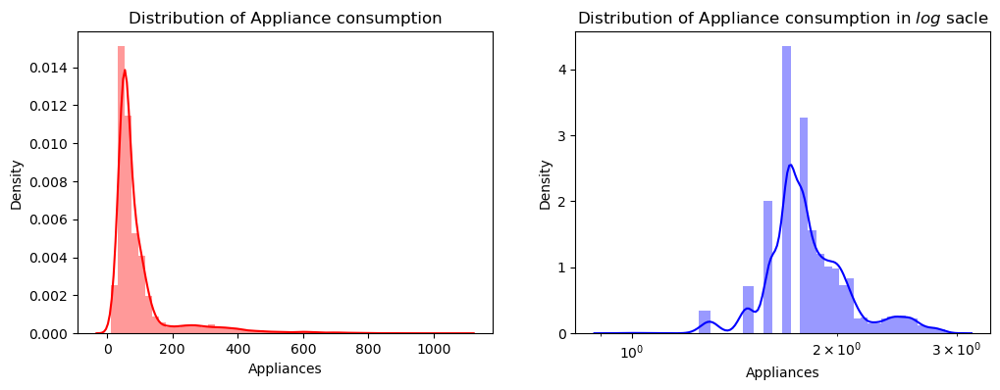

In [17]:
f= plt.figure(figsize=(12,4))

ax=f.add_subplot(121)
sns.distplot(df['Appliances'],bins=50,color='r',ax=ax)
ax.set_title('Distribution of Appliance consumption')

ax=f.add_subplot(122)
sns.distplot(np.log10(df['Appliances']),bins=40,color='b',ax=ax)
ax.set_title('Distribution of Appliance consumption in $log$ sacle')
ax.set_xscale('log');

**Majority of the energy consumption values are +-100 Wh.**

## <font color=blue> Pairwise correlation </font>

### <font color=green> Check pairwise correlation of variables </font>

In [18]:
def corrank(X):
    import itertools
    df = pd.DataFrame([[(i,j),X.corr().loc[i,j]] for i,j in list(itertools.combinations(X.corr(), 2))],columns=['pairs','corr'])    
    return df.sort_values(by='corr',ascending=False).reset_index(drop=True)

corrank(df)

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


,pairs,corr
0,"(rv1, rv2)",1.000000
1,"(T6, T_out)",0.974787
2,"(T7, T9)",0.944776
3,"(T5, T9)",0.911055
4,"(T3, T9)",0.901324
5,"(RH_3, RH_4)",0.898978
6,"(RH_4, RH_7)",0.894301
7,"(T1, T3)",0.892402
8,"(T4, T9)",0.889439
9,"(T3, T5)",0.888169


**RV1,RV2 have the same values. They are redundant**

**As expected, Temperature columns are highly correlated, RH columns are highly correlated**


### <font color=green> Visualize Appliance variable (output variable)</font>

In [19]:
appliance_visualize = go.Scatter( x= df.date  ,  mode = "lines", y = df.Appliances )
layout = go.Layout(title = 'Appliance energy consumption measurement' , xaxis=dict(title='Date'), yaxis=dict(title='Wh'))
fig = go.Figure(data=[appliance_visualize],layout=layout)

iplot(fig)

In [20]:
def daily(x,df=None):
    return df.groupby('day_of_week')[x].mean()
def hourly(x,df=None):
    return df.groupby('hour')[x].mean()

def monthly_daily(x,df=None):
    by_day = df.pivot_table(index='weekday', 
                                columns=['month'],
                                values=x,
                                aggfunc='mean')
    return round(by_day, ndigits=2)

In [21]:
df['weekday'] = ((pd.to_datetime(df['date']).dt.dayofweek)// 5 == 1).astype(float)

In [22]:
df_daily_plot = daily('Appliances',df_dates).reset_index(drop=False)
fig = px.bar(df_daily_plot, x="day_of_week", y="Appliances", color="day_of_week")
fig.update_layout(annotations=[],title = '<b>Average consumption across days</b>',title_x=0.5)
fig.update_yaxes(tickfont_family="Arial Black")
fig.update_xaxes(tickfont_family="Arial Black")
fig.show()

## <font color=blue> Upsample the data </font>

In [23]:
df['date'] = pd.to_datetime(df['date'])
df_daily = df.resample('D', on='date').mean().rename(columns={'Appliances':'Appliances_Daily_AVG'})
df_monthly = df.resample('M', on='date').mean().rename(columns={'Appliances':'Appliances_MONTHLY_AVG'})
df_weekly = df.resample('W', on='date').mean().rename(columns={'Appliances':'Appliances_weekly_AVG'})

## <font color=blue> Daily average consumption </font>

In [24]:
fig = px.line(df_daily, x=df_daily.index, y="Appliances_Daily_AVG")
fig.update_layout(annotations=[],title = '<b>Daily Average consumption of Appliances</b>',title_x=0.5)
fig.update_traces(line_color='#000000', line_width=5)
fig.update_yaxes(tickfont_family="Arial Black")
fig.update_xaxes(tickfont_family="Arial Black")
fig.show()

## <font color=blue> Weekly average consumption </font>

In [25]:
fig = px.line(df_weekly,x=df_weekly.index, y="Appliances_weekly_AVG")
fig.update_layout(annotations=[],title = '<b>Weekly Average consumption of Appliances</b>',title_x=0.5)
fig.update_traces(line_color='#000000', line_width=5)
fig.update_yaxes(tickfont_family="Arial Black")
fig.update_xaxes(tickfont_family="Arial Black")
fig.show()

## <font color=blue> Monthly average consumption </font>

In [26]:
fig = px.line(df_monthly,x=df_monthly.index, y="Appliances_MONTHLY_AVG")
fig.update_layout(annotations=[],title = '<b>Monthly Average consumption of Appliances</b>',title_x=0.5)
fig.update_traces(line_color='#000000', line_width=5)
fig.update_yaxes(tickfont_family="Arial Black")
fig.update_xaxes(tickfont_family="Arial Black")
fig.show()

## <font color=blue> Lag plots for each week </font>

In [27]:
df['week'] = df['date'].dt.week
df['month'] = df['date'].dt.month
df['day_of_week'] = df['date'].dt.day_of_week
df.head()

Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.


,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,weekday,week,month,day_of_week
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.200000,41.626667,18.2,48.900000,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433,0.0,2,1,0
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.200000,41.560000,18.2,48.863333,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195,0.0,2,1,0
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.200000,41.433333,18.2,48.730000,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668,0.0,2,1,0
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,55.09,6.433333,83.423333,17.133333,41.290000,18.1,48.590000,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389,0.0,2,1,0
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,17.200000,55.09,6.366667,84.893333,17.200000,41.230000,18.1,48.590000,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097,0.0,2,1,0


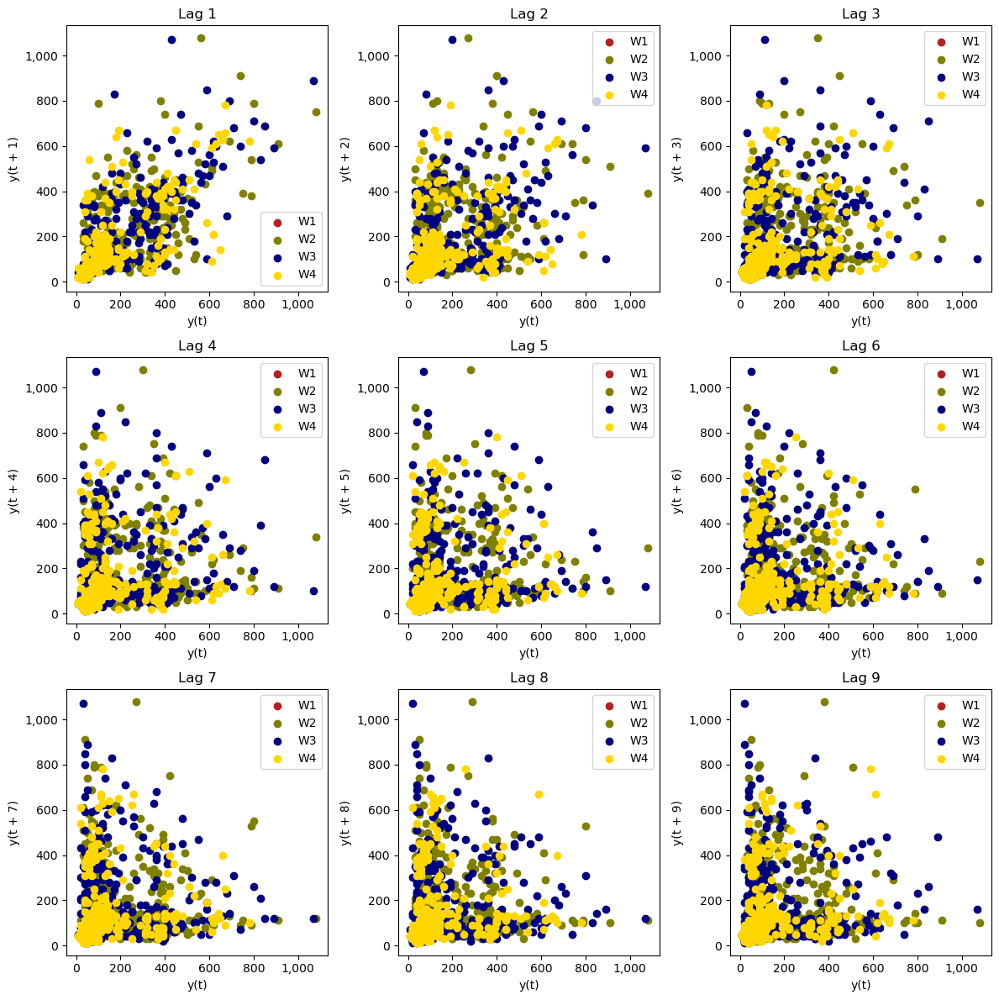

In [28]:
plt.figure(figsize=(12,12))

for i in range(1, 10):
    ax=plt.subplot(3, 3, i)
    # Create a lag plot for each week
    pd.plotting.lag_plot(df.loc[df['week'] == 1, 'Appliances'], lag=i, c='firebrick', label='W1')    
    pd.plotting.lag_plot(df.loc[df['week'] == 2, 'Appliances'], lag=i, c='olive', label='W2')
    pd.plotting.lag_plot(df.loc[df['week'] == 3, 'Appliances'], lag=i, c='navy', label='W3')
    pd.plotting.lag_plot(df.loc[df['week'] == 4, 'Appliances'], lag=i, c='gold', label='W4')
    ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    plt.legend()
    plt.title(f'Lag {i}')

plt.tight_layout()
plt.show()

## <font color=blue> Lag plots for each month </font>

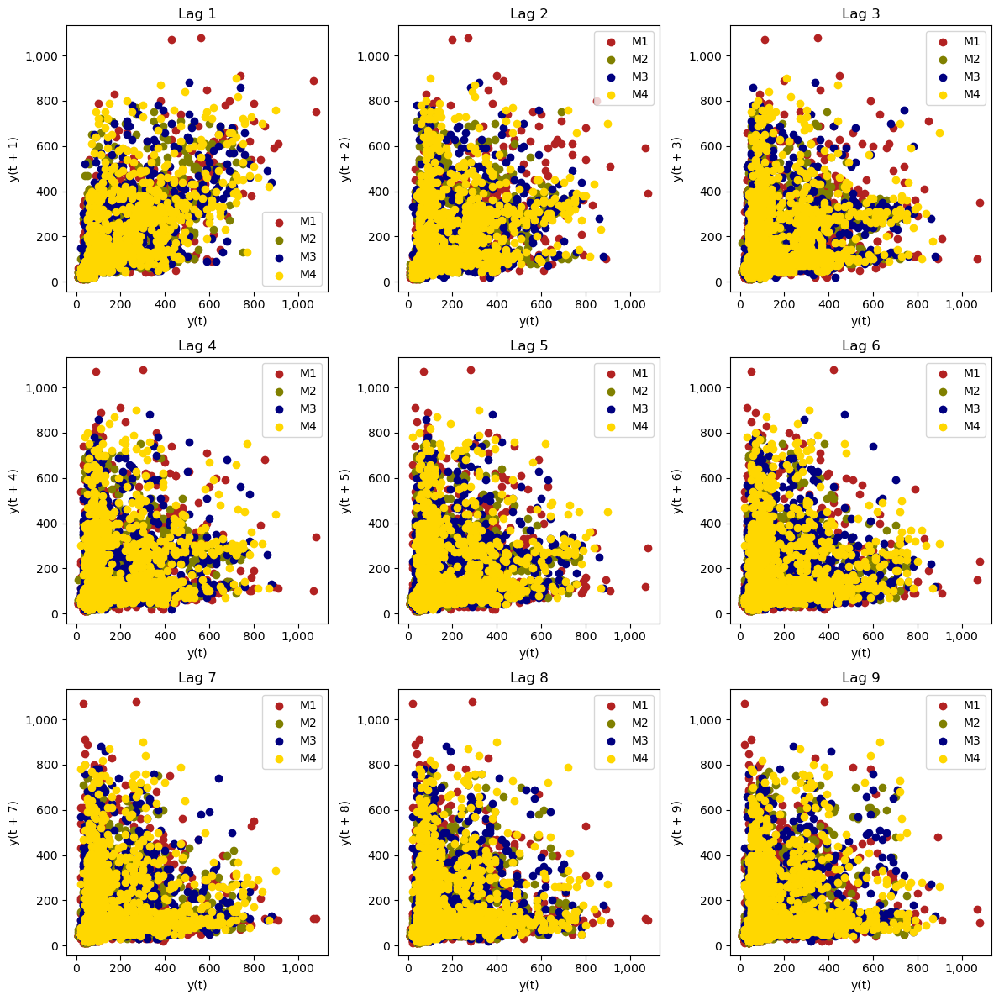

In [29]:
plt.figure(figsize=(12,12))

for i in range(1, 10):
    ax=plt.subplot(3, 3, i)
    # Create a lag plot for each quarter
    pd.plotting.lag_plot(df.loc[df['month'] == 1, 'Appliances'], lag=i, c='firebrick', label='M1')    
    pd.plotting.lag_plot(df.loc[df['month'] == 2, 'Appliances'], lag=i, c='olive', label='M2')
    pd.plotting.lag_plot(df.loc[df['month'] == 3, 'Appliances'], lag=i, c='navy', label='M3')
    pd.plotting.lag_plot(df.loc[df['month'] == 4, 'Appliances'], lag=i, c='gold', label='M4')
    ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    plt.legend()
    plt.title(f'Lag {i}')

plt.tight_layout()
plt.show()

## <font color=blue> Rolling average plot for every timestamp </font>

In [30]:
df['Appliances_MOVING_AVG'] = df['Appliances'].rolling(3, min_periods=3).mean()

In [31]:
df.head(1)

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,weekday,week,month,day_of_week,Appliances_MOVING_AVG
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.79,19.79,44.73,19.0,45.566667,17.166667,55.2,7.026667,84.256667,17.2,41.626667,18.2,48.9,17.033333,45.53,6.6,733.5,92.0,7.0,63.0,5.3,13.275433,13.275433,0.0,2,1,0,NaN


In [32]:
fig = px.line(df, x='date', y=["Appliances","Appliances_MOVING_AVG"],color_discrete_sequence=["red", "black"])
fig.update_layout(annotations=[],title = '<b>Moving Average consumption of Appliances</b>',title_x=0.5)
fig.update_traces(line_width=3)
fig.update_yaxes(tickfont_family="Arial Black")
fig.update_xaxes(tickfont_family="Arial Black")
fig.show()

## <font color=blue> Rolling average plot for weekly timestamp </font>

In [33]:
df_weekly['Appliances_weekly_MOVING_AVG'] = df_weekly['Appliances_weekly_AVG'].rolling(3, min_periods=3).mean()

In [34]:
fig = px.line(df_weekly, x=df_weekly.index, y=["Appliances_weekly_AVG","Appliances_weekly_MOVING_AVG"],color_discrete_sequence=["red", "black"])
fig.update_layout(annotations=[],title = '<b>Weekly Moving Average consumption of Appliances</b>',title_x=0.5)
fig.update_traces(line_width=5)
fig.update_yaxes(tickfont_family="Arial Black")
fig.update_xaxes(tickfont_family="Arial Black")
fig.show()

**Most of the peak values are either between 9-11 am or 6-8pm**

## <font color=blue> STL Components </font>

In [35]:
# Decompose the timeseries data
res = STL(df_weekly['Appliances_weekly_AVG'], period=12).fit()

In [36]:
res.resid.reset_index()

,date,resid
0,2016-01-17,1.421085e-14
1,2016-01-24,-1.421085e-14
2,2016-01-31,0.000000e+00
3,2016-02-07,2.842171e-14
4,2016-02-14,4.263256e-14
5,2016-02-21,0.000000e+00
6,2016-02-28,1.421085e-14
7,2016-03-06,1.421085e-14
8,2016-03-13,1.421085e-14
9,2016-03-20,-1.421085e-14


In [37]:
df_weekly

,Appliances_weekly_AVG,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,weekday,Appliances_weekly_MOVING_AVG
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-17,121.953642,6.721854,20.962234,41.737713,20.166034,40.544694,20.594156,42.854035,19.760685,42.419140,18.389265,54.798876,3.070905,88.262908,18.551358,39.964191,19.494498,47.291371,17.317803,44.390178,3.311479,754.075055,86.665563,5.231236,35.835541,1.190066,25.036957,25.036957,0.317881,NaN
2016-01-24,96.190476,4.503968,18.970265,40.441365,17.974727,40.214326,18.917096,40.790425,17.456529,39.969101,16.820185,53.708987,0.831882,93.969017,16.847105,35.171123,18.977896,44.869436,16.048824,41.253069,1.004762,762.671875,87.510417,2.833333,44.312004,-0.939633,24.596125,24.596125,0.285714,NaN
2016-01-31,75.456349,3.144841,20.005942,44.619035,19.273765,44.096729,20.190810,44.414958,18.371305,45.722824,17.579043,53.924227,7.697507,93.897689,17.506104,42.451083,18.564247,49.441613,16.778068,47.663142,7.987847,759.602431,85.652282,6.366071,38.823909,5.627232,24.398854,24.398854,0.285714,97.866823
2016-02-07,98.888889,8.253968,21.899081,45.254812,21.202797,43.658324,22.204695,44.857060,20.193363,45.767525,19.363306,59.850094,8.164529,87.134010,18.682540,41.599908,21.020277,50.563748,18.437951,48.228296,8.118750,756.964881,85.206845,6.167163,38.941468,5.661359,24.978941,24.978941,0.285714,90.178571
2016-02-14,113.164683,6.130952,21.302147,41.967263,20.262200,40.922187,21.618146,41.632917,19.701390,41.398220,19.096061,56.216249,4.398293,87.964482,19.467948,37.500229,22.269478,45.797866,18.662627,42.753549,4.141319,740.906647,88.877480,5.039683,39.943948,2.363095,25.232881,25.232881,0.285714,95.836640
2016-02-21,95.704365,6.001984,20.710680,38.556534,19.124841,38.867243,20.856470,38.653882,19.335080,38.142178,18.044963,49.620350,3.606054,78.508496,18.629957,33.004104,20.943382,41.690927,17.911025,40.882103,3.704762,759.311161,84.805060,4.664683,40.343254,1.245734,25.840731,25.840731,0.285714,102.585979
2016-02-28,87.996032,5.138889,20.858445,39.199510,19.301477,39.520449,21.060442,38.861889,20.423914,37.229783,18.460406,53.192886,3.772250,70.347468,19.304841,35.177279,21.053576,42.091771,18.195554,40.721177,3.684970,755.085565,79.818948,3.552083,36.321429,0.222371,25.652853,25.652853,0.285714,98.955026
2016-03-06,97.251984,4.593254,20.541072,37.455738,18.769166,38.180866,20.705141,37.322472,19.470372,35.896685,18.193824,49.819484,3.571767,70.619919,18.929556,31.309888,21.063118,40.454812,18.220072,39.399786,3.449355,748.789187,85.402778,4.624504,38.742560,1.022321,24.742969,24.742969,0.285714,93.650794
2016-03-13,90.674603,4.295635,20.450469,37.097774,18.287926,38.707424,20.372729,36.870123,19.908097,34.820512,18.004459,48.999429,4.143903,57.640491,19.400754,31.622979,21.368137,39.235207,18.104583,38.888595,3.925050,758.726538,78.708333,2.975198,39.947917,0.242014,24.857132,24.857132,0.285714,91.974206


In [38]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=4, cols=1)



fig.append_trace(go.Scatter(
    x=df_weekly.index,
    y=df_weekly['Appliances_weekly_AVG'],
    name='Average weekly Appliances consumption',
), row=1, col=1)

fig.append_trace(go.Scatter(
    x=res.trend.reset_index()['date'],
    y=res.trend.reset_index()['trend'],
    name='Trend component of the time series',
), row=2, col=1)


fig.append_trace(go.Scatter(
    x=res.seasonal.reset_index()['date'],
    y=res.seasonal.reset_index()['season'],
    name='Seasonal component of the time series',
), row=3, col=1)

fig.append_trace(go.Scatter(
    x=res.resid.reset_index()['date'],
    y=res.resid.reset_index()['resid'],
    name='Residual component of the time series',
), row=4, col=1)

fig.update_traces(line_width=5)
fig.update_layout(annotations=[],title = '<b>STL Components</b>',title_x=0.5)
fig.update_yaxes(tickfont_family="Arial Black")
fig.update_xaxes(tickfont_family="Arial Black")
fig.update_layout(height=600, width=800)
fig.show()

## <font color=blue> Split train,test </font>

In [39]:
df = df.drop('date',1)

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.


In [40]:
# 75% of the data is usedfor the training of the models and the rest is used for testing
train, test = train_test_split(df1,test_size=0.25,random_state=40)

In [41]:
# Seperate dependent and independent variables 
predicted_vars = train["Appliances"]
feature_vars = train.drop("Appliances",1)

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.


In [42]:
#Split training dataset into independent and dependent varibales
X_train = train[feature_vars.columns]
y_train = train['Appliances']

#Split testing dataset into independent and dependent varibales
X_test = test[feature_vars.columns]
y_test = test['Appliances']

X_train.drop(["Visibility","rv1","rv2","T6","T9"],axis=1 , inplace=True)
X_test.drop(["Visibility","rv1","rv2","T6","T9"], axis=1, inplace=True)


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


## <font color=blue> Distribution of variables </font>

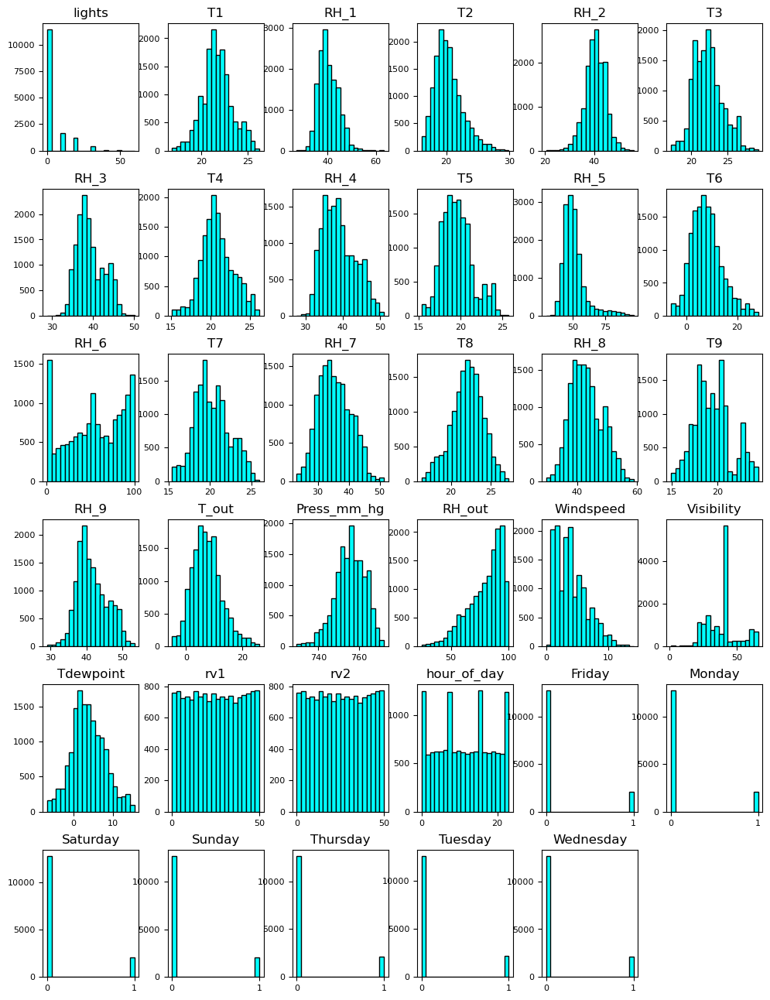

In [43]:
pd.options.plotting.backend = 'matplotlib'
feature_vars.hist(bins = 20 , figsize= (12,16), color='cyan', edgecolor='black',grid=False,linewidth=1.0,xlabelsize=8, ylabelsize=8);

**RH_6,RH_out,Windspeed, Visibility have non-normal distribution**

**rv1,rv2 are almost constant**

**Rest are all having normal distribution**

## <font color=blue> Scale the input values </font>

In [44]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()


sc_train = pd.DataFrame(columns=train.columns , index=train.index)
sc_train[sc_train.columns] = sc.fit_transform(train)
sc_test= pd.DataFrame(columns=test.columns , index=test.index)
sc_test[sc_test.columns] = sc.fit_transform(test)

In [45]:
X_train =  sc_train.drop(['Appliances'] , axis=1)
y_train = sc_train['Appliances']

X_test =  sc_test.drop(['Appliances'] , axis=1)
y_test = sc_test['Appliances']

## <font color=blue><center> (OPTIONAL CONTENT):Modeling</center></font>

## <font color=blue> Use multiple models to see which one is the best! </font>

In [46]:
models = [

           ['RandomForest ',RandomForestRegressor()],
           ['ExtraTreeRegressor :',ExtraTreesRegressor()],
           ['GradientBoostingClassifier: ', GradientBoostingRegressor()] ,
           ['XGBRegressor: ', xgb.XGBRegressor()] ,
           ['LGBRegressor: ',lgb.LGBMRegressor(boosting_type='dart',objective='regression',metric='rmse',n_jobs=1, verbose=-1,random_state=0)],
         ]

## <font color=blue> Use R2, mean squared error as evaluation criteria </font>

In [47]:
model_data = []
for name,curr_model in models :
    curr_model_data = {}
    curr_model.random_state = 78
    curr_model_data["Name"] = name
    start = time.time()
    curr_model.fit(X_train,y_train)
    end = time.time()
    curr_model_data["Train_Time"] = end - start
    curr_model_data["Train_R2_Score"] = sklearn.metrics.r2_score(y_train,curr_model.predict(X_train))
    curr_model_data["Test_R2_Score"] = sklearn.metrics.r2_score(y_test,curr_model.predict(X_test))
    curr_model_data["Test_RMSE_Score"] = sqrt(mean_squared_error(y_test,curr_model.predict(X_test)))
    model_data.append(curr_model_data)

In [48]:
pd.options.plotting.backend = "plotly"
df_model = pd.DataFrame(model_data)
df_model.head()

,Name,Train_Time,Train_R2_Score,Test_R2_Score,Test_RMSE_Score
0,RandomForest,52.125356,0.932834,0.523065,0.690605
1,ExtraTreeRegressor :,10.272609,1.000000,0.582885,0.645845
2,GradientBoostingClassifier:,10.830774,0.373524,0.281815,0.847458
3,XGBRegressor:,2.545571,0.845420,0.463380,0.732544
4,LGBRegressor:,0.823480,0.551217,0.389134,0.781579


In [49]:
df_model.plot(x="Name", y=['Test_R2_Score' , 'Train_R2_Score' , 'Test_RMSE_Score'], kind="bar" , title = 'R2 Score Results' )

## <font color=blue> Hyperparameter tuning to see which set of parameters gives the best result! </font>

In [50]:
from sklearn.model_selection import GridSearchCV
param_grid = [{
              'max_depth': [80, 150, 200,250],
              'n_estimators' : [100,150,200,250],
              'max_features': ["auto", "sqrt", "log2"]
            }]
reg = ExtraTreesRegressor(random_state=40)
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = reg, param_grid = param_grid, cv = 5, n_jobs = -1 , scoring='r2' , verbose=2)
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


GridSearchCV(cv=5, estimator=ExtraTreesRegressor(random_state=40), n_jobs=-1,
             param_grid=[{'max_depth': [80, 150, 200, 250],
                          'max_features': ['auto', 'sqrt', 'log2'],
                          'n_estimators': [100, 150, 200, 250]}],
             scoring='r2', verbose=2)

In [51]:
grid_search.best_params_

{'max_depth': 80, 'max_features': 'sqrt', 'n_estimators': 200}

In [52]:
grid_search.best_estimator_


ExtraTreesRegressor(max_depth=80, max_features='sqrt', n_estimators=200,
                    random_state=40)

In [53]:
grid_search.best_estimator_.score(X_train,y_train)

1.0

In [54]:
grid_search.best_estimator_.score(X_test,y_test)

0.6089091702812237

## <font color=blue> Which set of features are important for the model? </font>

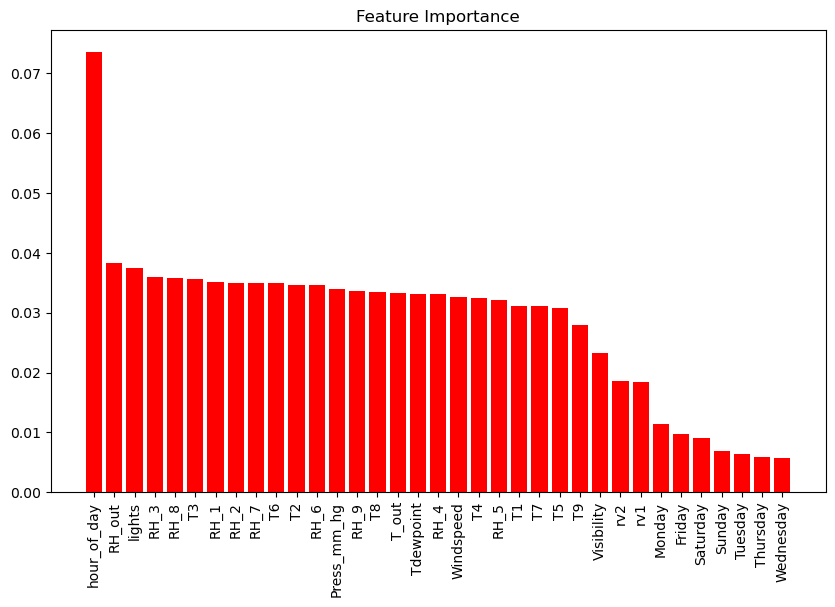

In [55]:
importances = grid_search.best_estimator_.feature_importances_
indices = np.argsort(importances)[::-1]
names = [X_train.columns[i] for i in indices]

plt.figure(figsize=(10,6))
plt.title("Feature Importance")

# Add bars
plt.bar(range(X_train.shape[1]), importances[indices],color='red')
# Feature names as x-axis labels
plt.xticks(range(X_train.shape[1]), names, rotation=90)

# Show plot
plt.show()

## <font color=blue>Model Interpretability using SHAP values (SHapley Additive exPlanations)</font>

In [56]:
models = [
           ['XGBRegressor: ', xgb.XGBRegressor()] ,
         ]

In [57]:
model_data = []
for name,curr_model in models :
    curr_model_data = {}
    curr_model.random_state = 78
    curr_model_data["Name"] = name
    start = time.time()
    curr_model.fit(X_train,y_train)
    end = time.time()
    curr_model_data["Train_Time"] = end - start
    curr_model_data["Train_R2_Score"] = sklearn.metrics.r2_score(y_train,curr_model.predict(X_train))
    curr_model_data["Test_R2_Score"] = sklearn.metrics.r2_score(y_test,curr_model.predict(X_test))
    curr_model_data["Test_RMSE_Score"] = sqrt(mean_squared_error(y_test,curr_model.predict(X_test)))
    model_data.append(curr_model_data)

In [58]:
curr_model

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=78, ...)

In [59]:
explainer = shap.TreeExplainer(curr_model)
shap_values = explainer.shap_values(X_test)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


In [60]:
X_shap = pd.DataFrame(shap_values)
X_shap.tail()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34
4929,-0.056823,-0.089761,-0.079870,-0.141137,0.200530,-0.061884,0.023355,-0.062781,0.046008,-0.055736,0.024834,0.002755,0.047818,0.000726,0.094802,-0.028196,-0.022083,-0.020620,0.010278,-0.239058,0.044189,0.093582,0.010463,-0.008010,-0.051018,-0.009824,0.0,0.134886,-0.002950,-0.036678,-0.031536,-0.002121,-0.000966,0.000890,0.000497
4930,0.041433,-0.072914,0.065821,0.042076,-0.247041,-0.096866,-0.073926,0.081634,0.111455,-0.019628,-0.025264,-0.042082,0.004585,-0.005321,-0.020539,-0.056362,-0.016152,-0.012187,0.042105,-0.032133,0.055499,0.017415,0.007581,0.001397,-0.012649,-0.032559,0.0,0.352654,-0.004401,-0.006914,0.048252,-0.000576,-0.003771,0.000433,-0.000051
4931,-0.029348,-0.219849,0.001830,0.025159,-0.094184,0.220059,0.075010,-0.020861,0.067885,0.201349,0.022972,-0.029251,0.001401,0.012815,-0.057483,-0.147619,-0.053096,0.021603,0.019577,-0.024571,0.007714,-0.023334,-0.019152,0.003687,0.084442,-0.005564,0.0,-0.419808,-0.007866,-0.003803,-0.010831,-0.001947,0.000067,-0.000532,-0.000081
4932,-0.017781,0.014802,-0.106346,-0.006885,-0.031502,0.013341,-0.002907,0.032177,-0.005754,-0.015635,0.062969,-0.012013,-0.021771,0.010034,0.008078,-0.012488,0.019184,0.022134,-0.018051,0.027540,0.014160,-0.025314,-0.008924,0.000832,0.000954,0.006319,0.0,-0.330018,-0.008383,-0.002945,0.038849,-0.000989,-0.002956,0.001140,-0.001436
4933,-0.021427,0.022110,-0.034444,0.031299,-0.022587,-0.021098,0.010967,-0.022947,0.016234,-0.030897,-0.003970,0.028124,0.005889,-0.000480,-0.024999,0.030041,0.002696,-0.024630,-0.026717,-0.026493,0.002917,-0.012930,-0.006176,0.003952,-0.019074,0.003291,0.0,-0.326898,0.034665,-0.003005,-0.003981,-0.000590,0.001212,0.001491,-0.000040


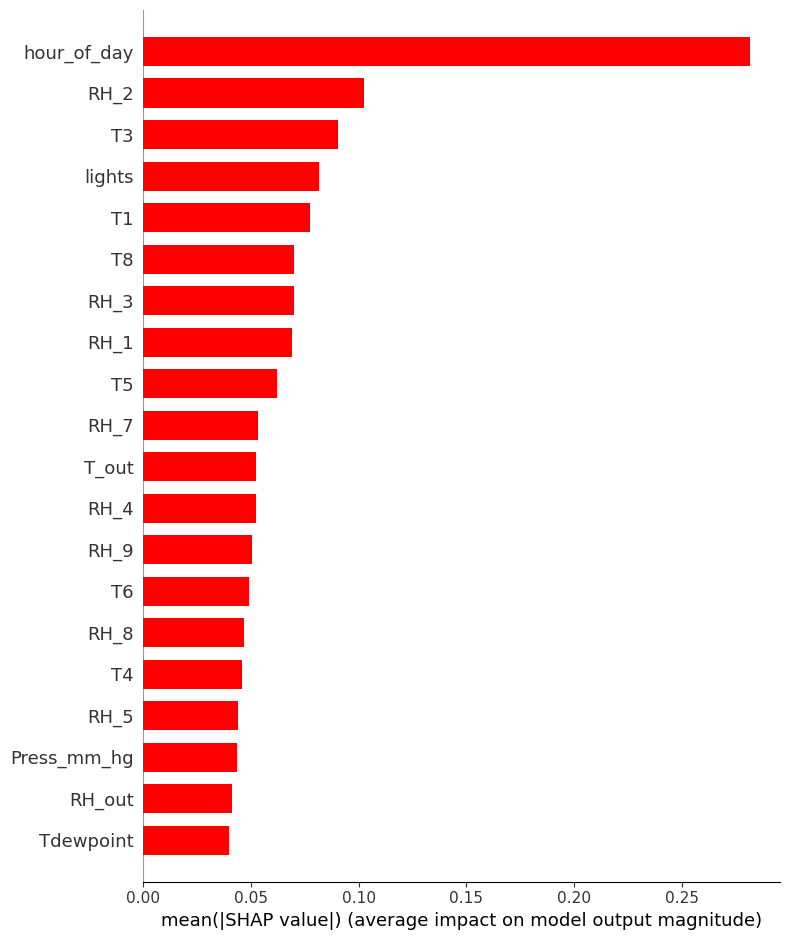

In [61]:
shap.summary_plot(shap_values, X_test, plot_type="bar", color='red')

In [62]:
shap.initjs()

In [63]:
shap.force_plot(explainer.expected_value, shap_values[0,:], X_test.iloc[0,:])

In [64]:
shap.force_plot(explainer.expected_value, shap_values[:1000,:], X_test.iloc[:1000,:])


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


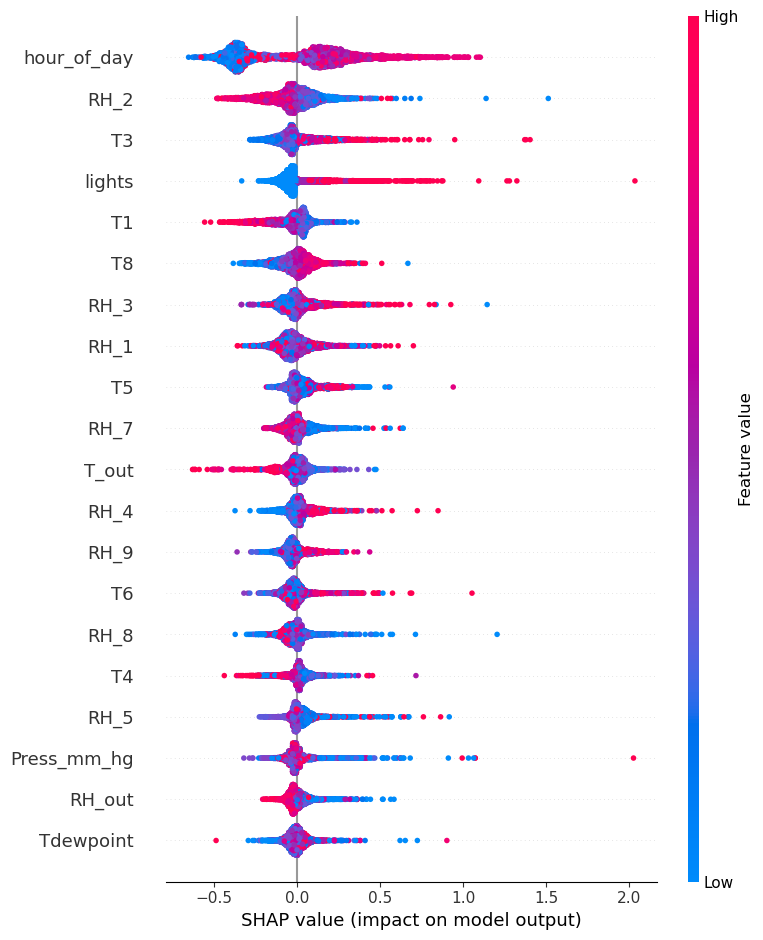

In [65]:
shap.summary_plot(shap_values, X_test)

**It is interesting to confirm again that hour of the day (as we saw earlier) play positive important role in the final prediction**

## <font color=red> Summary Next steps </font>

**Use a bayes optimizer as a replacement for grid search**

**Apply interpretability to most of the other models**

**Add uncertainty to the prediction levels - to be explored**

**Time series approach instead of supervised learning - SARIMAX with PyMC3, LSTM methods**

## References

https://shap.readthedocs.io/en/latest/index.html
    
https://scikit-learn.org/0.15/modules/generated/sklearn.ensemble.ExtraTreesRegressor.html

https://github.com/fmfn/BayesianOptimization
    
Luis M. Candanedo, Veronique Feldheim, Dominique Deramaix, Data driven prediction models of energy use of appliances in a low-energy house, Energy and Buildings, Volume 140, 1 April 2017, Pages 81-97, ISSN 0378-7788,

In [66]:
df_dummy = pd.DataFrame()
df_dummy['Source'] = ['Refrigeration','Cooking','Clothes dryers','Freezers','Clothes Washers','Dishwashers','Color TV & boxes',
                     'Personal Computers & related','Others']
df_dummy['Utilisation'] = [16,5,8,3,1,4,14,8,40]

In [67]:
fig = px.bar(df_dummy, x="Source", y="Utilisation", color="Source",text="Utilisation")
fig.update_layout(annotations=[],title = '<b>Energy Consumption Pattern</b>',title_x=0.5)
fig.update_yaxes(tickfont_family="Arial Black")
fig.update_xaxes(tickfont_family="Arial Black")
fig.show()

# Happy Learning